In [1]:
from keras.preprocessing.image import ImageDataGenerator,load_img
import matplotlib.pyplot as plt
from keras.models import Model
from keras.layers import Input, Conv2D, concatenate, GlobalAveragePooling2D, Dense, MaxPooling2D, Dropout, ReLU, Add, BatchNormalization,Multiply, GlobalAveragePooling2D, Reshape,DepthwiseConv2D
from keras.optimizers import RMSprop
import cv2
import glob
import numpy as np
import tensorflow as tf
from PIL import Image
from tensorflow.keras.metrics import Metric,Precision, Recall
from sklearn.metrics import precision_recall_curve, roc_curve, auc, f1_score
from sklearn.metrics import auc,confusion_matrix,precision_recall_curve, roc_curve
from sklearn.preprocessing import label_binarize
from keras.utils.vis_utils import plot_model
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

2023-12-13 23:04:21.366942: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-13 23:04:22.382194: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
train_dir = r'/home/featurize/data/Training'
test_dir = r'/home/featurize/data/Test'
#The total number of images: 90483.
#Training set size: 67692 images (one fruit or vegetable per image).
#Test set size: 22688 images (one fruit or vegetable per image).
#The number of classes: 131 (fruits and vegetables).
#Image size: 100x100 pixels.

In [3]:
#find out the total calsses of dataset.
className = glob.glob(train_dir + "/*")
numberOfClass = len(className)
print("NumberOfClass: ",numberOfClass)

NumberOfClass:  131


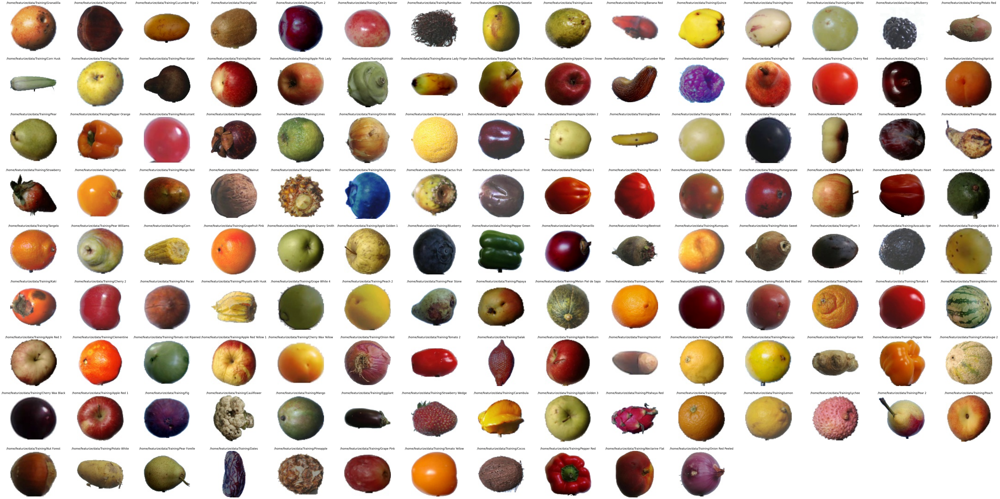

In [4]:
plt.figure(figsize=(80,40))

for i, folder in enumerate(className):

    images = glob.glob(folder + "/*.jpg")

    image_path = images[0]

    img = load_img(image_path)
    plt.subplot((numberOfClass + 4) // 15, 15, i + 1)
    plt.imshow(img)
    plt.title(folder.split("\\")[-1])
    plt.axis('off')

plt.show()

In [5]:
def denoise_background(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    _, thresh = cv2.threshold(gray, 240, 255, cv2.THRESH_BINARY)
    thresh_rgb = cv2.cvtColor(thresh, cv2.COLOR_GRAY2RGB)
    np.copyto(image, thresh_rgb, where=thresh_rgb == 255)
    return image

In [6]:
# Load and preprocess the training data
train_datagen = ImageDataGenerator(
    preprocessing_function=denoise_background,
    rescale=1.0/255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    zoom_range=0.15,
    horizontal_flip=True,
    validation_split=0.068,
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(100, 100),
    batch_size=32,
    class_mode='categorical',
    color_mode='rgb', 
    subset='training' 
)

validation_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(100,100),
    batch_size=32,
    class_mode='categorical',
    color_mode='rgb', 
    subset='validation'
)

# Load and preprocess the test data
test_datagen = ImageDataGenerator(rescale=1.0/255)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(100,100),
    batch_size=32,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=False 
)

Found 63145 images belonging to 131 classes.
Found 4547 images belonging to 131 classes.
Found 22688 images belonging to 131 classes.


In [7]:
input_shape = Input(shape=(100,100,3))

In [8]:
class CustomAccuracy(Metric):
    def __init__(self, name='accuracy', **kwargs):
        super(CustomAccuracy, self).__init__(name=name, **kwargs)
        self.correct = self.add_weight(name='correct', initializer='zeros')
        self.total = self.add_weight(name='total', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_pred_classes = tf.argmax(y_pred, axis=1)
        y_true_classes = tf.argmax(y_true, axis=1)
        correct_predictions = tf.equal(y_pred_classes, y_true_classes)
        correct_predictions = tf.cast(correct_predictions, 'float32')
        
        self.correct.assign_add(tf.reduce_sum(correct_predictions))
        self.total.assign_add(tf.cast(tf.size(y_true_classes), 'float32'))

    def result(self):
        return tf.divide(self.correct, self.total)

    def reset_state(self):
        self.correct.assign(0)
        self.total.assign(0)


In [9]:
class CustomCrossEntropyLoss(tf.keras.losses.Loss):
    def __init__(self, name='loss', **kwargs):
        super(CustomCrossEntropyLoss, self).__init__(name=name, **kwargs)

    def call(self, y_true, y_pred):
        epsilon = 1e-10
        y_pred = tf.clip_by_value(y_pred, epsilon, 1 - epsilon)

        loss = -tf.reduce_sum(y_true * tf.math.log(y_pred), axis=-1)

        return loss

Model 1: inception block +SE           
Model2: res_block+DepthwiseConv+SE

In [10]:
def se_block(input_tensor, ratio=16):
# Squeeze-and-Excitation block
    channels = input_tensor.shape[-1]
    se = GlobalAveragePooling2D()(input_tensor)
    se = Dense(channels // ratio, activation='relu')(se)
    se = Dense(channels, activation='sigmoid')(se)
    se = Reshape((1, 1, channels))(se)
    scaled_input = Multiply()([input_tensor, se])
    return scaled_input

def inception_block(x, br1, br2_1, br2_2, br3_1, br3_2, br4):
    # Branch 1
    branch1 = Conv2D(br1, (1, 1), padding='same', activation='relu')(x)
    # Branch 2 3x3-> 1x3 3x1
    branch2 = Conv2D(br2_1, (1, 1), padding='same', activation='relu')(x)
    #branch2 = Conv2D(br2_2, (3, 3), padding='same', activation='relu')(branch2)
    branch2 = Conv2D(br2_2, (1, 3), padding='same', activation='relu')(branch2)
    branch2 = Conv2D(br2_2, (3, 1), padding='same', activation='relu')(branch2)
    # Branch 3 5x5->3x3 3x3-> 1x3 3x1 1x3 3x1 
    branch3 = Conv2D(br3_1, (1, 1), padding='same', activation='relu')(x)
    #branch3 = Conv2D(br3_2, (5, 5), padding='same', activation='relu')(branch3)
    branch3 = Conv2D(br3_2, (1, 3), padding='same', activation='relu')(branch3)
    branch3 = Conv2D(br3_2, (3, 1), padding='same', activation='relu')(branch3)
    branch3 = Conv2D(br3_2, (1, 3), padding='same', activation='relu')(branch3)
    branch3 = Conv2D(br3_2, (3, 1), padding='same', activation='relu')(branch3)
    # Branch 4
    branch4 = MaxPooling2D((3, 3), strides=(1, 1), padding='same')(x)
    branch4 = Conv2D(br4, (1, 1), padding='same', activation='relu')(branch4)
    # Concatenate all the branches
    branch_output = concatenate([branch1, branch2, branch3, branch4], axis=-1)
    # After the Inception block, apply the SE block
    branch_output = se_block(branch_output)
    return branch_output

x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_shape)
x = BatchNormalization()(x)
x = MaxPooling2D(2, 2)(x)
x = inception_block(x, 64, 96, 64, 16, 32, 32)
x = BatchNormalization()(x)
x = MaxPooling2D(2, 2)(x)
x = inception_block(x, 128, 128, 128, 32, 64, 64)
x = BatchNormalization()(x)
x = MaxPooling2D(2, 2)(x)
x = inception_block(x, 160, 160, 160, 48, 96, 96)
x = BatchNormalization()(x)
x = MaxPooling2D(2, 2)(x)
# Final layers
x = GlobalAveragePooling2D()(x)
output = Dense(numberOfClass, activation='softmax')(x)
model_1 = Model(inputs=input_shape, outputs=output)

def res_block(input_tensor, filters, strides=1):
    shortcut = input_tensor

    # First component of main path
    x = Conv2D(filters, (1, 1), strides=strides, padding='same')(input_tensor)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # Second component of main path
    x = DepthwiseConv2D((3, 3), padding='same', depth_multiplier=1)(x)
    x = Conv2D(filters, (1, 1), padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # Third component of main path
    x = Conv2D(filters * 4, (1, 1), padding='same')(x)
    x = BatchNormalization()(x)
    x = se_block(x)

    # Shortcut path
    if strides != 1 or shortcut.shape[-1] != filters * 4:
        shortcut = Conv2D(filters * 4, (1, 1), strides=strides, padding='same')(shortcut)
        shortcut = BatchNormalization()(shortcut)

    # Final step: Add shortcut value to main path
    x = Add()([x, shortcut])
    x = ReLU()(x)
    return x


def combined_model():

    x = Conv2D(64, kernel_size=(7, 7), strides=2, padding='same')(input_shape)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = MaxPooling2D(2,2)(x)

    x = res_block(x, filters=64, strides=1)
    x = res_block(x, filters=128, strides=2)
    x = res_block(x, filters=256, strides=2)
    x = res_block(x, filters=512, strides=2)
    x = MaxPooling2D(2,2)(x)

    x = GlobalAveragePooling2D()(x)
    output = Dense(numberOfClass, activation='softmax')(x)

    model_2 = Model(inputs=input_shape, outputs=output)
    concatenated_output= concatenate([model_1.output, model_2.output])

    x = Dense(128, activation='relu')(concatenated_output) 
    x = BatchNormalization()(x) 
    x = Dropout(0.3)(x)
    x = Dense(64, activation='relu')(x)
    x = BatchNormalization()(x) 
    x = Dropout(0.3)(x)
    ensemble_output= Dense(numberOfClass, activation='softmax')(x)
    #Build the ensemble model
    combined_model = Model(inputs=input_shape, outputs= ensemble_output)
    return model_1, model_2, combined_model

2023-12-13 23:04:43.926127: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-12-13 23:04:43.935795: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-12-13 23:04:43.936049: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

In [11]:
#model_1, model_2 are used in the heat map.
model_1, model_2, combined_model=combined_model()
combined_model.summary()


Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 100, 100, 3)]        0         []                            
                                                                                                  
 conv2d_31 (Conv2D)          (None, 50, 50, 64)           9472      ['input_1[0][0]']             
                                                                                                  
 batch_normalization_4 (Bat  (None, 50, 50, 64)           256       ['conv2d_31[0][0]']           
 chNormalization)                                                                                 
                                                                                                  
 re_lu (ReLU)                (None, 50, 50, 64)           0         ['batch_normalization_4[

In [12]:
#Build the ensemble model
combined_model.compile(optimizer=RMSprop(learning_rate=0.001), loss=CustomCrossEntropyLoss(),metrics=[CustomAccuracy(), Precision(name='precision'),Recall(name='recall')])

Generate the model structure

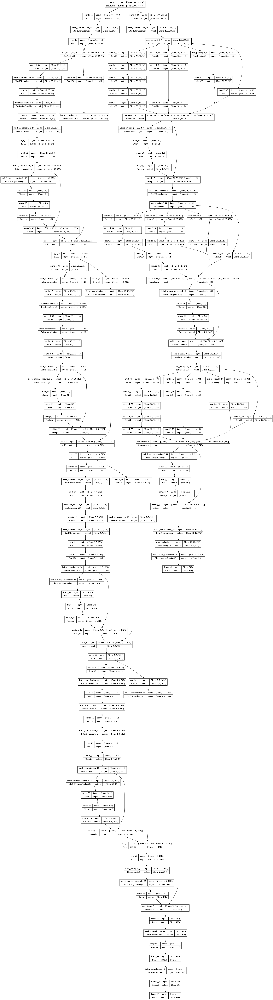

In [45]:
from keras.utils.vis_utils import plot_model
plot_model(combined_model, to_file='model_structure1211.png', show_shapes=True, show_layer_names=True)

Run the model

In [12]:
# Compile the model
history=combined_model.fit(train_generator, epochs=40, validation_data=validation_generator)

Epoch 1/40


2023-12-13 17:02:49.727840: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2023-12-13 17:02:54.985414: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-12-13 17:02:57.415966: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7f858ea6bff0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-12-13 17:02:57.416207: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3060, Compute Capability 8.6
2023-12-13 17:02:57.577155: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:255] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-12-13 17:02:58.229603: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the p

1974/1974 [==============================] - 252s 106ms/step - loss: 2.0057 - accuracy: 0.4909 - precision: 0.8376 - recall: 0.2832 - val_loss: 0.9480 - val_accuracy: 0.6939 - val_precision: 0.7845 - val_recall: 0.6180
Epoch 2/40
1974/1974 [==============================] - 197s 100ms/step - loss: 0.4030 - accuracy: 0.8852 - precision: 0.9192 - recall: 0.8366 - val_loss: 1.3126 - val_accuracy: 0.6670 - val_precision: 0.7346 - val_recall: 0.6307
Epoch 3/40
1974/1974 [==============================] - 200s 101ms/step - loss: 0.2152 - accuracy: 0.9398 - precision: 0.9529 - recall: 0.9241 - val_loss: 2.0958 - val_accuracy: 0.5841 - val_precision: 0.6372 - val_recall: 0.5628
Epoch 4/40
1974/1974 [==============================] - 193s 98ms/step - loss: 0.1542 - accuracy: 0.9586 - precision: 0.9659 - recall: 0.9505 - val_loss: 0.4000 - val_accuracy: 0.8933 - val_precision: 0.9063 - val_recall: 0.8828
Epoch 5/40
1974/1974 [==============================] - 198s 100ms/step - loss: 0.1157 - acc

Draw the plots

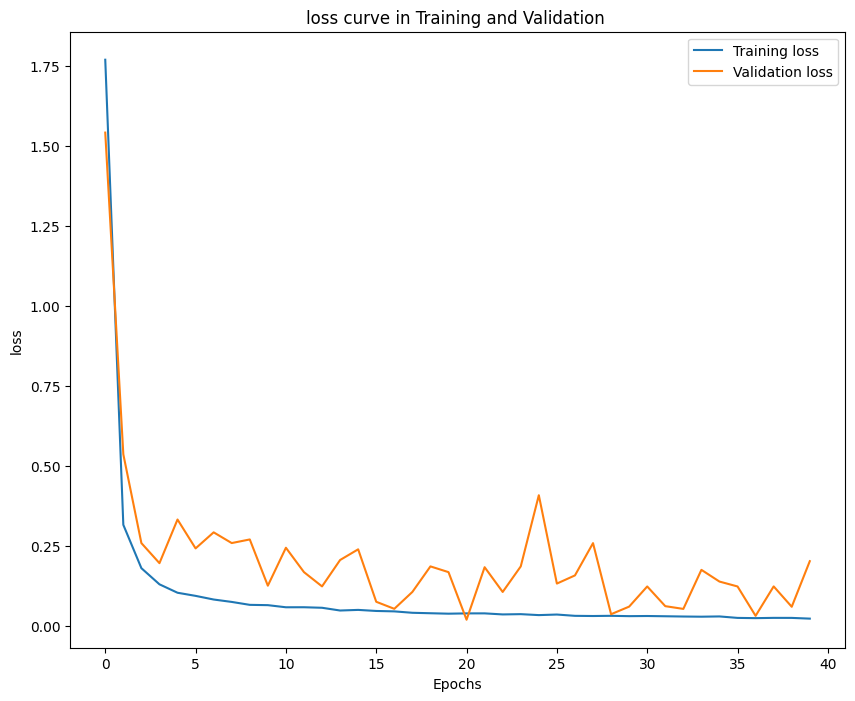

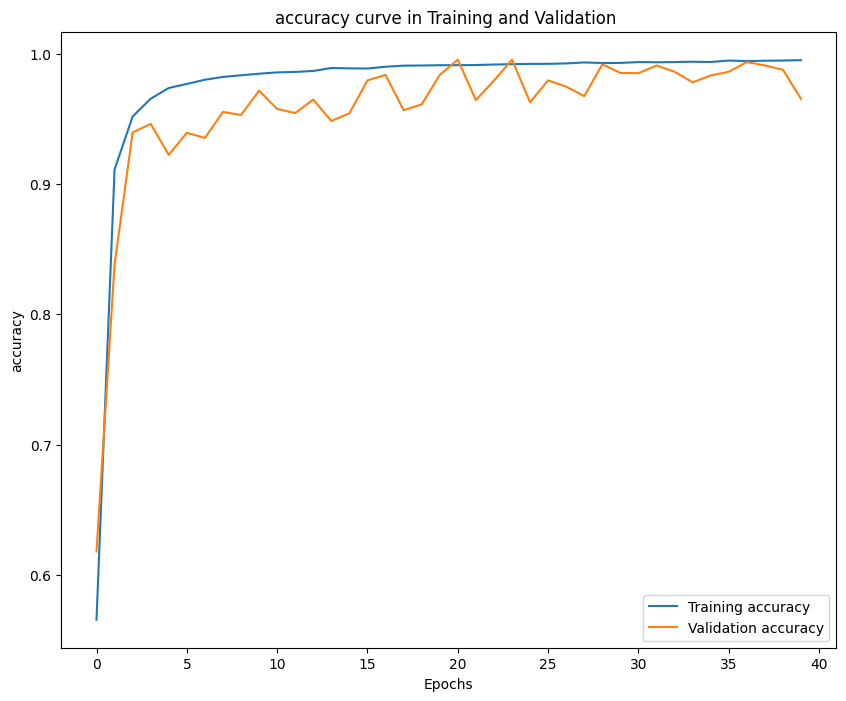

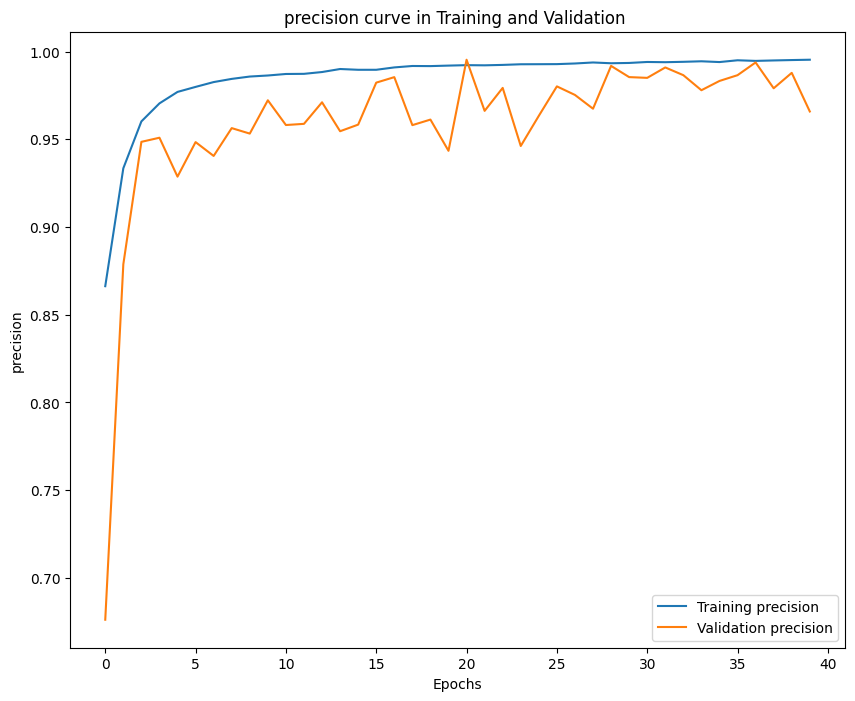

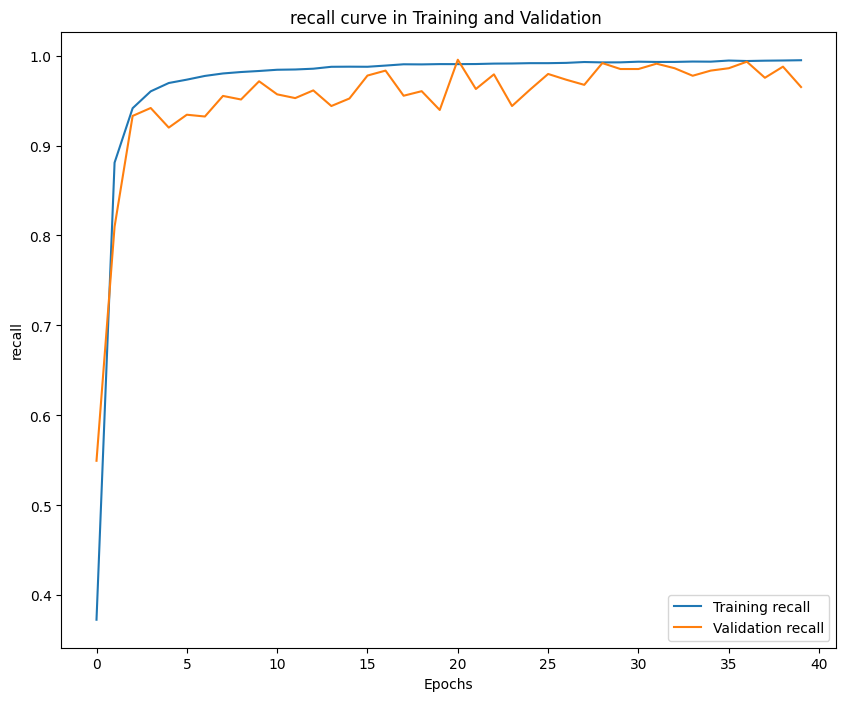

<Figure size 640x480 with 0 Axes>

In [14]:
def plot_metrics(history, metrics):
    plt.figure(figsize=(20, 20))
    for i, metric in enumerate(metrics):
        plt.subplot(2, 2, i+1)
        plt.plot(history.history[metric], label='Training ' + metric)
        val_metric = 'val_' + metric
        if val_metric in history.history:
            plt.plot(history.history[val_metric], label='Validation ' + metric)
        plt.xlabel('Epochs')
        plt.ylabel(metric)
        plt.title(metric+' curve in Training and Validation ')
        plt.legend()
        

    plt.tight_layout()
    plt.show()
plot_metrics(history, ['loss', 'accuracy', 'precision', 'recall'])

Save the trained model

In [14]:
save_history_ensemble_model = pd.DataFrame(history.history)

save_history_ensemble_model.to_csv("ensemble_model_training_history_40epoch_1213.csv", index=False)

save_path=r'ensemble_model1213_40epochs.h5'
combined_model.save(save_path)

/environment/miniconda3/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Load the trained model

In [13]:
load_path=r"/home/featurize/data/combined_model1211_40epochs.h5"
combined_model=tf.keras.models.load_model(load_path,custom_objects={'CustomAccuracy':CustomAccuracy(),'CustomCrossEntropyLoss':CustomCrossEntropyLoss()})

In [14]:
# collect all the images and lables
all_images, all_true_labels = zip(*[next(test_generator) for _ in range(test_generator.samples // test_generator.batch_size)])
all_images = np.concatenate(all_images)
all_true_labels = np.concatenate(all_true_labels)

#predict those lables
predictions = combined_model.predict(all_images)
predicted_labels = np.argmax(predictions, axis=1)

all_true_labels = np.argmax(all_true_labels, axis=1)


2023-12-13 22:39:51.272922: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 2722560000 exceeds 10% of free system memory.
2023-12-13 22:39:53.873432: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 2722560000 exceeds 10% of free system memory.
2023-12-13 22:39:57.841186: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2023-12-13 22:39:58.960419: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


709/709 [==============================] - 18s 20ms/step


Confusion Matirx

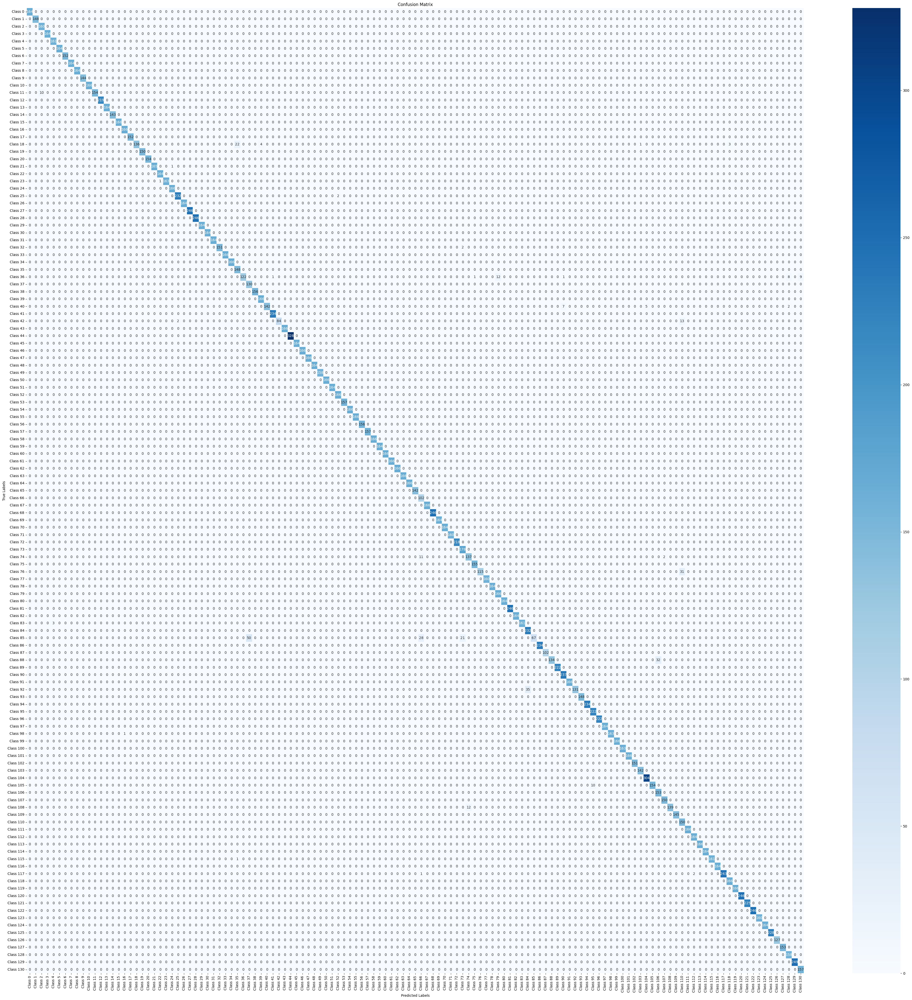

In [15]:
#generate the confusion matrix
conf_matrix = confusion_matrix(all_true_labels, predicted_labels)
plt.figure(figsize=(50, 50))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=[f"Class {i}" for i in range(131)], yticklabels=[f"Class {i}" for i in range(131)])
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()


Recall Precision Accuracy Kappa

In [16]:
n_classes = 131 

# Initialize TP, FP, FN, TN
TP = np.zeros(n_classes)
FP = np.zeros(n_classes)
FN = np.zeros(n_classes)
TN = np.zeros(n_classes)

# Assuming conf_matrix is already defined
for i in range(n_classes):
    TP[i] = conf_matrix[i, i]
    FP[i] = conf_matrix[:, i].sum() - TP[i]
    FN[i] = conf_matrix[i, :].sum() - TP[i]
    TN[i] = conf_matrix.sum() - (TP[i] + FP[i] + FN[i])

micro_TP = TP.sum()
micro_FP = FP.sum()
micro_FN = FN.sum()
micro_TN = TN.sum()

accuracy = (micro_TP + micro_TN) / (micro_TP + micro_FP + micro_FN + micro_TN)
recall = micro_TP / (micro_TP + micro_FN)
precision = micro_TP / (micro_TP + micro_FP)
specificity = micro_TN / (micro_TN + micro_FP)

# Calculate F1-score
f1_score = 2 * (precision * recall) / (precision + recall)

# Kappa
total_accuracy = (micro_TP + micro_TN) / (micro_TP + micro_FP + micro_FN + micro_TN)
random_accuracy = ((micro_TP + micro_FP) * (micro_TP + micro_FN) + (micro_FN + micro_TN) * (micro_FP + micro_TN)) / (micro_TP + micro_FP + micro_FN + micro_TN)**2
kappa = (total_accuracy - random_accuracy) / (1 - random_accuracy)

print(f"Accuracy: {accuracy}")
print(f"Recall/Sensitivity: {recall}")
print(f"Precision: {precision}")
print(f"Specificity: {specificity}")
print(f"F1 Score: {f1_score}")
print(f"Kappa: {kappa}")

Accuracy: 0.9997617868409436
Recall/Sensitivity: 0.9843970380818053
Precision: 0.9843970380818053
Specificity: 0.9998799772160138
F1 Score: 0.9843970380818053
Kappa: 0.9842770152978219


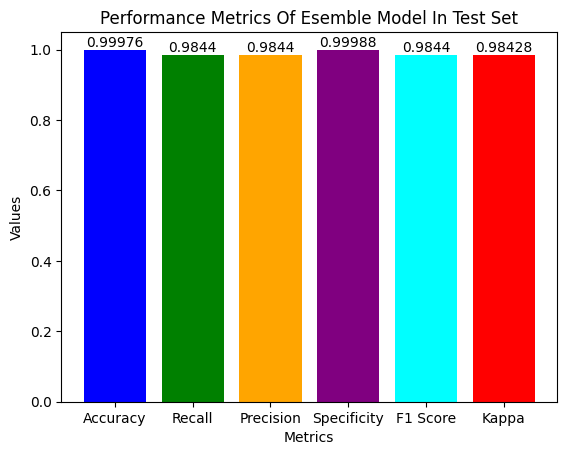

In [17]:
metrics = ['Accuracy', 'Recall', 'Precision', 'Specificity', 'F1 Score', 'Kappa']
values = [accuracy, recall, precision, specificity, f1_score, kappa]

bars = plt.bar(metrics, values, color=['blue', 'green', 'orange', 'purple', 'cyan', 'red'])

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 5), ha='center', va='bottom')

plt.title('Performance Metrics Of Esemble Model In Test Set')
plt.xlabel('Metrics')
plt.ylabel('Values')

plt.show()

PR

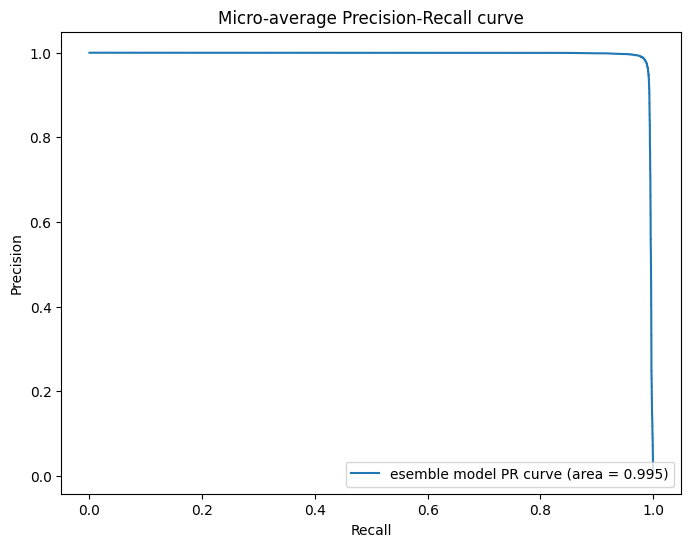

In [18]:
n_classes = 131


true_labels_binarized = label_binarize(all_true_labels, classes=range(n_classes))


precision = dict()
recall = dict()

for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(true_labels_binarized[:, i], predictions[:, i])


micro_precision, micro_recall, _ = precision_recall_curve(true_labels_binarized.ravel(), predictions.ravel())

plt.figure(figsize=(8, 6))
plt.plot(micro_recall, micro_precision, label='esemble model PR curve (area = {0:0.3f})'.format(auc(micro_recall, micro_precision)))

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Micro-average Precision-Recall curve')
plt.legend(loc="lower right")
plt.show()



ROC

<Figure size 1000x800 with 0 Axes>

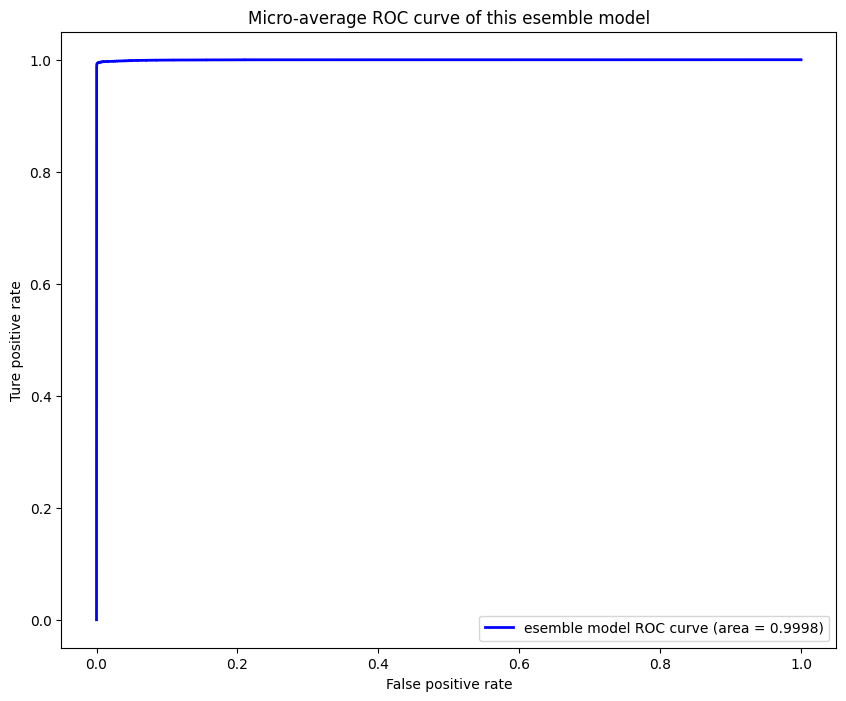

In [19]:
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(true_labels_binarized[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr["micro"], tpr["micro"], _ = roc_curve(true_labels_binarized.ravel(), predictions.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

plt.figure(figsize=(10, 8))

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))

# for every class
# for i in range(n_classes):
#     plt.plot(recall[i], precision[i], lw=1, alpha=0.3, label='PR curve of class {0} (AP = {1:0.2f})'.format(i, average_precision[i]))

plt.plot(fpr["micro"], tpr["micro"], label='esemble model ROC curve (area = {0:0.4f})'.format(roc_auc["micro"]), color='blue', linestyle='-', linewidth=2)

plt.xlabel('False positive rate')
plt.ylabel('Ture positive rate')
plt.title('Micro-average ROC curve of this esemble model')
plt.legend(loc="lower right")
plt.show()


Heat Map

In [14]:
model1_se_block_layer_name = model_1.layers[-5].name

model2_se_block_layer_name = model_2.layers[-7].name


print(model1_se_block_layer_name)
print(model2_se_block_layer_name)

multiply_2
multiply_6


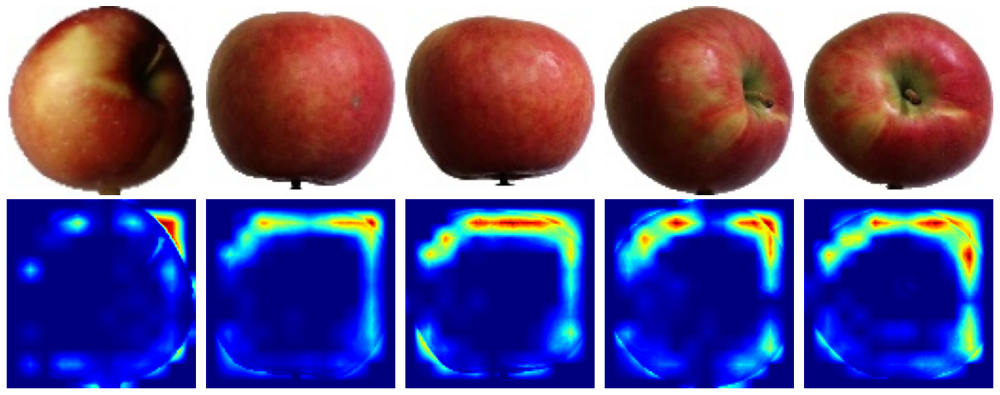

In [16]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Function to generate Grad-CAM
def generate_grad_CAM(model, img_array, target_layer, output_layer):
    # Create a sub-model to get intermediate layers' outputs
    grad_model = tf.keras.Model(
        [model.inputs],
        [model.get_layer(target_layer).output, model.get_layer(output_layer).output]
    )

    # Use GradientTape to compute the gradient of the specific class activation
    with tf.GradientTape() as tape:
        conv_output, model_output = grad_model(img_array)
        # Consider the output for the target class (class index 1 in this case)
        loss = model_output[:, 1]  

    # Compute the gradients with respect to the intermediate layer's output
    grads = tape.gradient(loss, conv_output)
    # Compute the global average pooling of the gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Get the intermediate layer's output and convert to numpy
    conv_output = conv_output.numpy()[0]
    pooled_grads = pooled_grads.numpy()

    # Weight the intermediate layer's output with the computed gradients
    for i in range(pooled_grads.shape[-1]):
        conv_output[:, :, i] *= pooled_grads[i]

    # Compute the heatmap by taking the mean along the last axis
    heatmap = np.mean(conv_output, axis=-1)
    # Apply ReLU to keep only positive values
    heatmap = np.maximum(heatmap, 0)

    # Normalize the heatmap
    max_value = np.max(heatmap)
    if max_value != 0:
        heatmap /= max_value
        
    return heatmap

# Extract output layer names for model 1 and model 2
model1_output_layer_name = model_1.output.name.split("/")[0]
model2_output_layer_name = model_2.output.name.split("/")[0]

# Number of images to display
num_images_to_display = 5  
fig, axs = plt.subplots(2, num_images_to_display, figsize=(15, 6)) 

# Loop through a batch of images
for i in range(num_images_to_display):
    batch = next(test_generator)
    img_array = batch[0]
    label = batch[1]

    # Generate Grad-CAM for both models
    heatmap_model1 = generate_grad_CAM(model_1, img_array, model1_se_block_layer_name, model1_output_layer_name)
    heatmap_model2 = generate_grad_CAM(model_2, img_array, model2_se_block_layer_name, model2_output_layer_name)

    # Resize and combine the heatmaps
    target_size = (max(heatmap_model1.shape[0], heatmap_model2.shape[0]), max(heatmap_model1.shape[1], heatmap_model2.shape[1]))
    heatmap1_resized = tf.image.resize(heatmap_model1[..., np.newaxis], target_size)[..., 0]
    heatmap2_resized = tf.image.resize(heatmap_model2[..., np.newaxis], target_size)[..., 0]
    heatmap = (heatmap1_resized + heatmap2_resized) / 2.0

    # Resize the heatmap for display
    heatmap_resized = tf.image.resize(heatmap[..., np.newaxis], (100, 100))[..., 0]
    heatmap_weighted = heatmap_resized * 1

    # Combine the weighted heatmap with the original image
    weighted_img = heatmap_weighted[..., np.newaxis] * img_array[0]
    weighted_img /= np.max(weighted_img)

    # Display the original image
    axs[0, i].imshow(img_array[0])
    axs[0, i].axis('off') 

    # Display the weighted heatmap
    axs[1, i].imshow(weighted_img[..., 0], cmap='jet')
    axs[1, i].axis('off')  

# Adjust layout for better visualization
plt.tight_layout()
plt.show()
